In [1]:
#Connecting to google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


!pip install patool

#### Unzipping data
import patoolib
patoolib.extract_archive("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/MRI+T1_T2+Dataset.RAR", outdir="/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/")

### Importing Libraries

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from keras.utils.vis_utils import plot_model

from io import BytesIO
from PIL import Image
import matplotlib.pyplot as plt

import imageio
import glob
import pathlib

from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from os import listdir

from numpy import asarray
from numpy import savez_compressed
from numpy import load

AUTOTUNE = tf.data.experimental.AUTOTUNE

### Loading the data

In [3]:
#Defining train and test datasets' paths
data_dir_t1 = pathlib.Path("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr1/TrainT1")
data_dir_t2 = pathlib.Path('/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr2/TrainT2')

In [4]:
image_count_t1 = len(list(data_dir_t1.glob('*.png')))
print(image_count_t1)
image_count_t2 = len(list(data_dir_t2.glob('*.png')))
print(image_count_t2)

43
46


- There are 43 T1 type MRI images.
- There are 46 T1 type MRI images.

### Data Visualisation

Loading a T1 type image

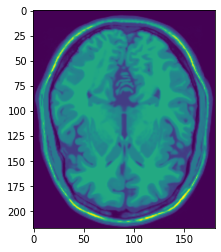

In [5]:
#uploaded = files.upload()
im_t1 = Image.open("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr1/TrainT1/Image #10.png")
plt.imshow(im_t1)
plt.show()

In [6]:
print(im_t1.width, im_t1.height)

181 217


- Dimensions of T1 type image: 181 x 217

Loading a T2 type image

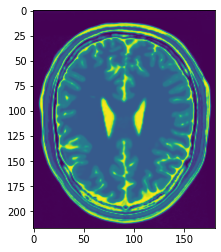

In [7]:
im_t2 = Image.open("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr2/TrainT2/Image #100.png")
plt.imshow(im_t2)
plt.show()

In [8]:
print(im_t2.width, im_t2.height)

181 217


- Dimensions of T2 type image: 181 x 217

### Creating dataset

Loading image at target size (additional check)

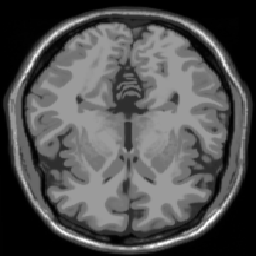

In [9]:
pixels1 = load_img("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr1/TrainT1/Image #10.png", target_size=(256,256))
pixels1

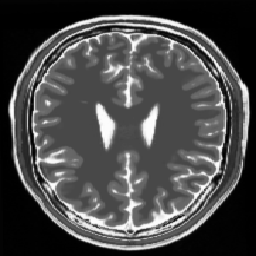

In [10]:
pixels2 = load_img("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr2/TrainT2/Image #100.png", target_size=(256,256))
pixels2

In [11]:
def load_image(path):
  dataset_list = []
  for i in listdir(path):
    px = load_img(path+i, target_size=(256,256))
    px = img_to_array(px)
    dataset_list.append(px)
  return np.asarray(dataset_list)

- The function load_image has been defined to load each image at the target size 256x256 and convert the entire image dataset to array.

In [12]:
#Loading T1 type and T2 type images
data_t1 = load_image("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr1/TrainT1/")
data_t2 = load_image("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Tr2/TrainT2/")

In [13]:
#Saving as .npz file to do a sample check of the images
filename = 'T1_and_T2.npz'
savez_compressed(filename, data_t1, data_t2)

Loaded:  (43, 256, 256, 3) (46, 256, 256, 3)


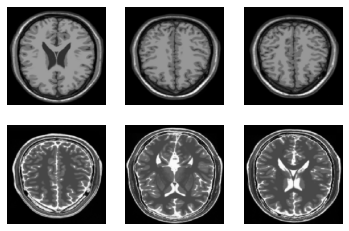

In [14]:
# load the dataset
data = load('T1_and_T2.npz')
d1,d2 = data['arr_0'], data['arr_1']    #arr_0 and arr_1 refer to T1 and T2 image data
print('Loaded: ', d1.shape, d2.shape)
# plot source images
n_samples = 3
for i in range(n_samples):
	plt.subplot(2, n_samples, 1 + i)
	plt.axis('off')
	plt.imshow(d1[i].astype('uint8'))
# plot target image
for i in range(n_samples):
	plt.subplot(2, n_samples, 1 + n_samples + i)
	plt.axis('off')
	plt.imshow(d2[i].astype('uint8'))
plt.show()

*Reference:* https://machinelearningmastery.com/cyclegan-tutorial-with-keras/

### Data Preprocessing

In [15]:
#Converting to grayscale
data_t1 = tf.image.rgb_to_grayscale(data_t1)
data_t2 = tf.image.rgb_to_grayscale(data_t2)

In [16]:
#Choosing default batch size for CycleGAN (1)
BATCH_SIZE = 1

In [17]:
#Batch data
data_t1 = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(data_t1))
data_t2 = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(data_t2))

Pre-Processing

In [18]:
def preprocess_img(image):
  image = tf.image.random_flip_left_right(image)      #additional preprocessing step - flipping images along vertical (left-right) axis
  image = tf.cast(image, tf.float32)       
  image = (image / 127.5) - 1     #normalizaing data
  return image

Reference: https://www.tensorflow.org/api_docs/python/tf/image/random_flip_left_right

Shuffling

In [19]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [20]:
BUFFER_SIZE = 1000

In [21]:
data_t1 = data_t1.map(
    preprocess_img, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE, seed=42).batch(BATCH_SIZE)

data_t2 = data_t2.map(
    preprocess_img, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE, seed=42).batch(BATCH_SIZE)

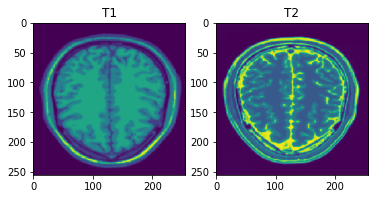

In [22]:
ex_t1 = next(iter(data_t1))
ex_t2 = next(iter(data_t2))

plt.subplot(121)
plt.title('T1')
plt.imshow(ex_t1[0].numpy()[:, :, 0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('T2')
plt.imshow(ex_t2[0].numpy()[:, :, 0] * 0.5 + 0.5)

*Reference:* 
1. https://towardsdatascience.com/horse-to-zebra-cycle-gan-in-tensorflow-2-0-d5ad979d0314
2. CycleGAN code provided by IIIT Bangalore and UpGrad (course syllabus)

<i><u><b>Note</b></u>: For the following sections, Model Building, Model Training and Creating GIF, the CycleGAN code provided by IIIT Bangalore and UpGrad ( as part of course syllabus) has been used as a reference.</i>

### Model Building

Performing normalisation

In [23]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

Downsampling
- Performed using usual convolution. Dimensions are reduced while number of filters stay the same. 
- Image is downsampled to size 1 x 1 and number of filters mentioned.
- Ex: T1 image is downsampled first.

In [24]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

Upsampling
- Here, de-convolution is performed where dimension increases (opposite of downsampling/convolution).
- Image is upsampled from 1 x 1 size back to original image size.
- Ex: Downsampled T1 image is upsampled to original size T2 image. 

In [25]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

U-net generator:
- Combines downsampling, upsampling and skip connections to translate one type of image to another (T1 type MRI to T2 type MRI and vice-versa).
- To do this, first downsampling is used on input Image to learn the latent characteristics and then upsampling is used to use this knowledge to translate it into another image.
- Skip Connections: Direct connections between layers of upsampling and downsampling. These connections ensure the transfer of static components (components of the image that do not require any changing) of the images such as the background. <br> <br>
<i><b>Note: More downsampling and upsampling layers were added (as compared to number of layers in CycleGAN code provided) and model was trained again, which gave a significant improvement in results.</b></i>

In [26]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(64, 4, False), #(128,128,64)
        downsample(128, 4), #(64,64,128)
        downsample(128, 4), #(32,32,128)
        downsample(128, 4), #(16,16,128)
        downsample(128, 4), #(8,8,128)
        downsample(128, 4), #(4,4,128)
        downsample(128, 4), #(2,2,128)
        downsample(128, 4)  #(1,1,128)
    ]
    up_stack = [
        upsample(128, 4, True), # (2, 2, 256)
        upsample(128, 4, True), # (4, 4, 256)
        upsample(128, 4), # (8, 8, 256)
        upsample(128, 4), # (16, 16, 256)
        upsample(128, 4), # (32, 32, 256)
        upsample(128, 4), # (64, 64, 256)
        upsample(64, 4) # (128, 128, 64)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh')
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[256, 256, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

CycleGAN has two generators. 
1. Transforming T1 to T2 type
2. Transforming T2 to T1 type

In [27]:
generator_g = unet_generator()
generator_f = unet_generator()

- CycleGAN Generators have U-net architechture. 
- As seen in the summary of the generator, downsampling occurs first. The dimension of the output shape after each sequential layers first reduces and then starts increasing, which corresponds to upsampling.
- The initial input dimensions and final output dimensions are same.

In [28]:
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 64  1024        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  131328      ['sequential[0][0]']             
                                                                                              

- Discriminator: This is a usual CNN used to classify images, i.e., usual convolution layers and therefore only downsampling is done.
- Binary classification is done (distinguish whether the image is real or not). <br> <br>
<i><b>Note: More downsampling (convolution) layers were added (as compared to number of layers in CycleGAN code provided) and model was trained again, which gave a significant improvement in results.</b></i>

In [29]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (256, 256, 1)
    inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x) #(128, 128, 64)
    down2 = downsample(128, 4)(down1) #(64, 64, 128)
    down3 = downsample(128, 4)(down2) #(32, 32, 128)
    down4 = downsample(128, 4)(down3) #(16, 16, 128)
    down5 = downsample(128, 4)(down4) #(8, 8, 128)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down5)  #(10,10,128)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)   #(7,7,256)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)    #(9,9,256)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)     #(6,6,1)
    return tf.keras.Model(inputs=inp, outputs=last)

### Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

We require two discriminators. 
1. Discriminator for 1st generator, converting T1 type to T2 type.
2. Discriminator for 2nd generator, converting T2 type to T1 type.

In [30]:
discriminator_x = discriminator()
discriminator_y = discriminator()

As it can be seen from the discriminator architechture, the dimensions are reducing after each sequential layer, ie.e, only downsampling occurs. 

In [31]:
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_30 (Sequential)  (None, 128, 128, 64)      1024      
                                                                 
 sequential_31 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_32 (Sequential)  (None, 32, 32, 128)       262400    
                                                                 
 sequential_33 (Sequential)  (None, 16, 16, 128)       262400    
                                                                 
 sequential_34 (Sequential)  (None, 8, 8, 128)         262400    
                                                                 
 zero_padding2d (ZeroPadding  (None, 10, 10, 128)      0   

Output of Untrained Generator models -  Generates only random noise (as no training has happened yet) as seen below

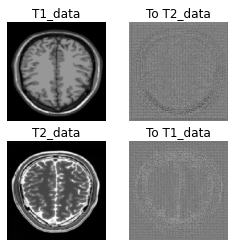

In [32]:
to_t2 = generator_g(ex_t1)
to_t1 = generator_f(ex_t2)
plt.figure(figsize=(4, 4))

imgs = [ex_t1, to_t2, ex_t2, to_t1]
title = ['T1_data', 'To T2_data', 'T2_data', 'To T1_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

Defining loss for Discriminator: <br>
Since discriminator performs binary classification, loss is defined as: Binary Cross Entropy Loss


In [33]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

Discriminator will have two types of losses:
1. Binary Cross Entropy Loss on real data
2. Binary Cross Entropy Loss on fake data
- Total discriminator loss incorporates both losses by considering average of the two losses. 

In [34]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

Generator loss - Binary Cross Entropy loss only for fake data since generators only need to generate (or translate to different domain/image type) fake images.

In [35]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

Cycle Consistency Loss: 
- There are two generators (one to convert T1 to T2 and one to convert T2 to T1). 
- The first can be used to convert real T1 image to generated T2 image and then this generated T2 image can be used to generate a T1 image. We then check the loss between the real T1 image and generated T1 image (generated from generated T2 image generated from real T1 image). 
- This loss is cycle consistency loss, which is mean of L1 loss, i.e, mean of absolute value of the difference the between two images.
- tf.reduce_mean is equivalent to np.mean. <br>
https://www.tensorflow.org/api_docs/python/tf/math/reduce_mean
- This loss is used only to train the generator and not the discriminator as this loss is an extra check applied to the generator.


In [36]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

Identity Loss:
- If we provide input image to generator for which output image is the same domain as input image, for example: providing T2 type image as input to generator that translates T1 type to T2 type, it should give the input image as the output (just as the indentity function does, f(x)=x). 
- Thus the loss (L1 loss) between input and output (same as input) should be null.
- This loss is used only to train the generator and not the discriminator as this loss is an extra check applied to the generator. 

In [37]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

We use Adam optimizer to update the weights for both, the  generators and the discriminators, as Adam is generally faster.

In [38]:
generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

Training is done for 100 epochs

In [39]:
EPOCHS = 100

### Checkpoint Initialisation <br>
Initialising checkpoints to save model (saving weights)

In [40]:
checkpoint_path = "/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

The generate_images function has been defined to print inout and predicted images for both generators at each epoch.

In [41]:
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

### Model Training

Sequence of Training Flow 
1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.

In [42]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

#### Train the CycleGAN Model for 100 Epochs
- Looping training function for 100 epochs and showing the output at each step.
- It can be seen below that the generator is able ti generate better images at each step.
- There is a clear improvement between the images generated by both generators at the first epoch and at the 100th epoch.

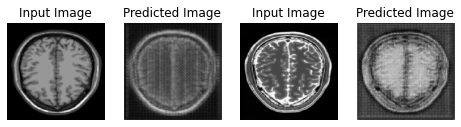

Saving checkpoint for epoch 1 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-1


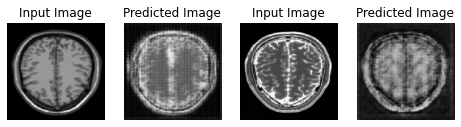

Saving checkpoint for epoch 2 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-2


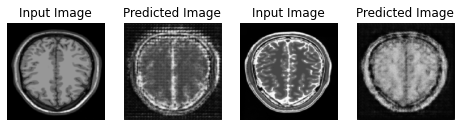

Saving checkpoint for epoch 3 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-3


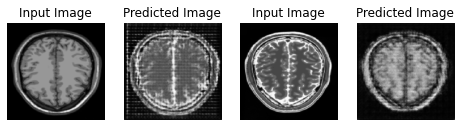

Saving checkpoint for epoch 4 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-4


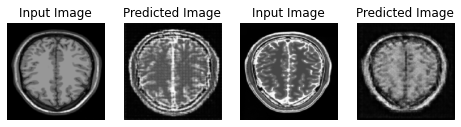

Saving checkpoint for epoch 5 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-5


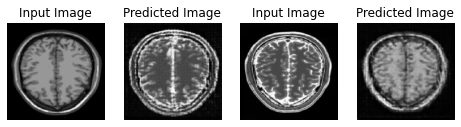

Saving checkpoint for epoch 6 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-6


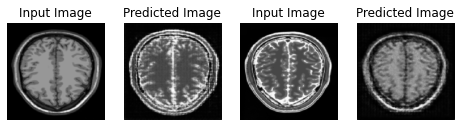

Saving checkpoint for epoch 7 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-7


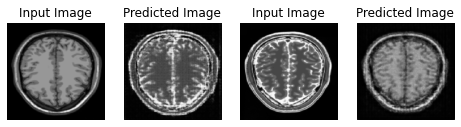

Saving checkpoint for epoch 8 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-8


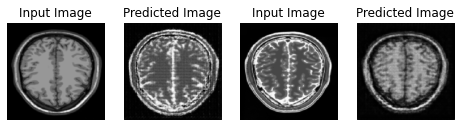

Saving checkpoint for epoch 9 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-9


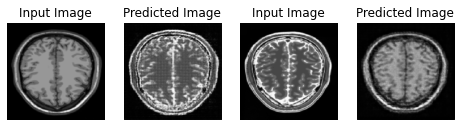

Saving checkpoint for epoch 10 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-10


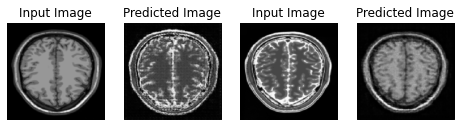

Saving checkpoint for epoch 11 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-11


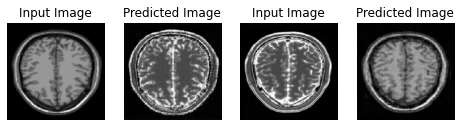

Saving checkpoint for epoch 12 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-12


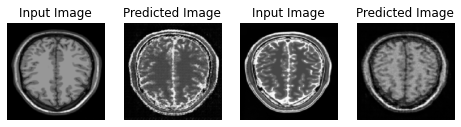

Saving checkpoint for epoch 13 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-13


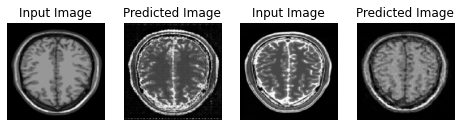

Saving checkpoint for epoch 14 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-14


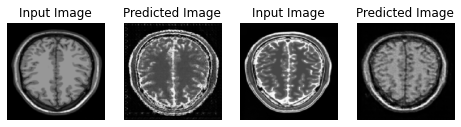

Saving checkpoint for epoch 15 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-15


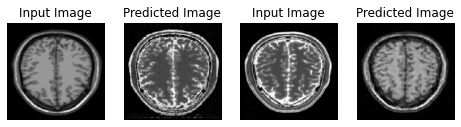

Saving checkpoint for epoch 16 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-16


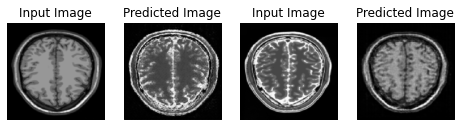

Saving checkpoint for epoch 17 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-17


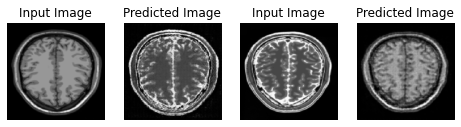

Saving checkpoint for epoch 18 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-18


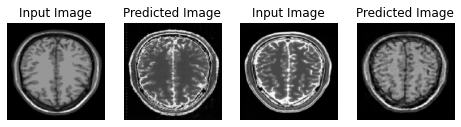

Saving checkpoint for epoch 19 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-19


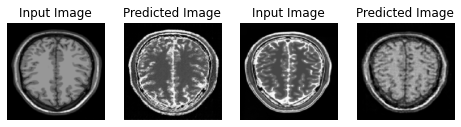

Saving checkpoint for epoch 20 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-20


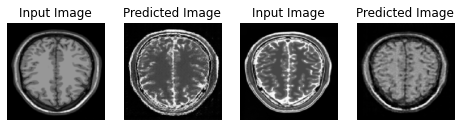

Saving checkpoint for epoch 21 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-21


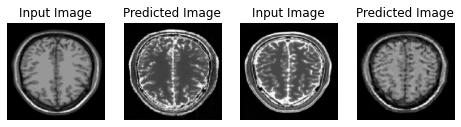

Saving checkpoint for epoch 22 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-22


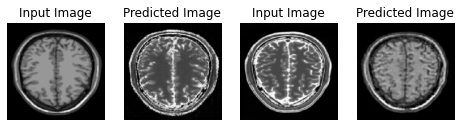

Saving checkpoint for epoch 23 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-23


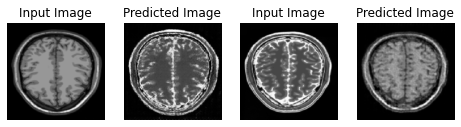

Saving checkpoint for epoch 24 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-24


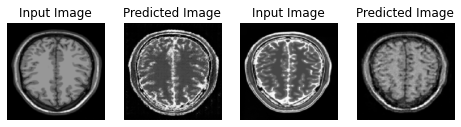

Saving checkpoint for epoch 25 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-25


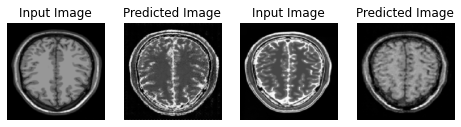

Saving checkpoint for epoch 26 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-26


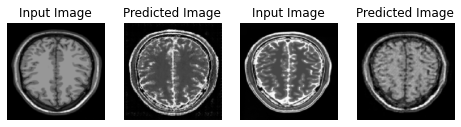

Saving checkpoint for epoch 27 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-27


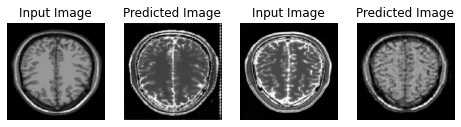

Saving checkpoint for epoch 28 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-28


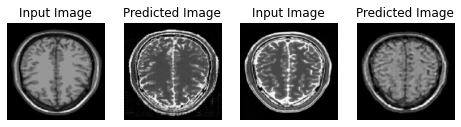

Saving checkpoint for epoch 29 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-29


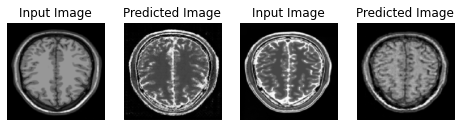

Saving checkpoint for epoch 30 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-30


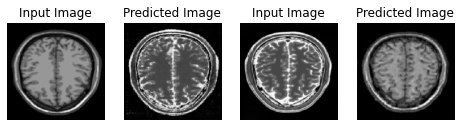

Saving checkpoint for epoch 31 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-31


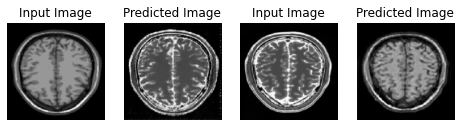

Saving checkpoint for epoch 32 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-32


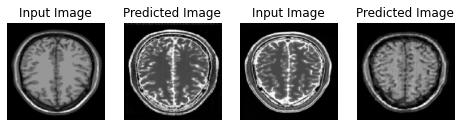

Saving checkpoint for epoch 33 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-33


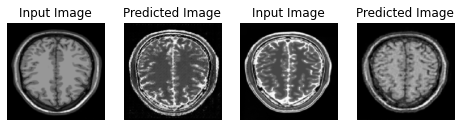

Saving checkpoint for epoch 34 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-34


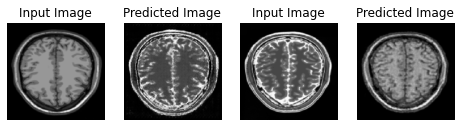

Saving checkpoint for epoch 35 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-35


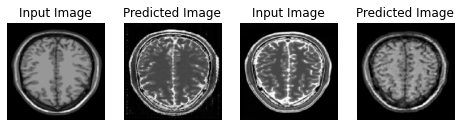

Saving checkpoint for epoch 36 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-36


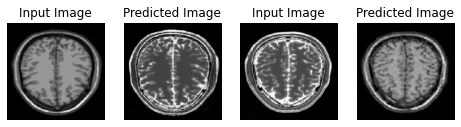

Saving checkpoint for epoch 37 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-37


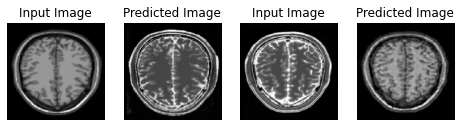

Saving checkpoint for epoch 38 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-38


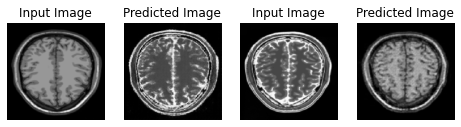

Saving checkpoint for epoch 39 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-39


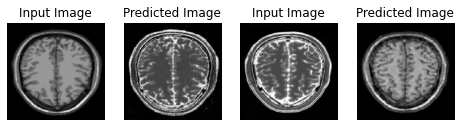

Saving checkpoint for epoch 40 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-40


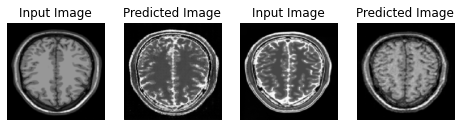

Saving checkpoint for epoch 41 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-41


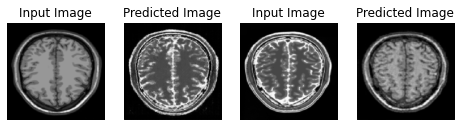

Saving checkpoint for epoch 42 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-42


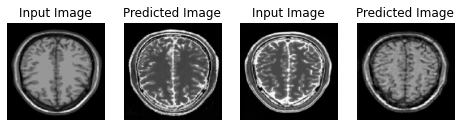

Saving checkpoint for epoch 43 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-43


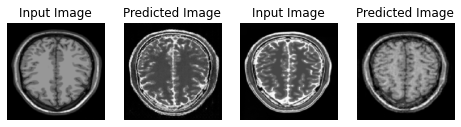

Saving checkpoint for epoch 44 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-44


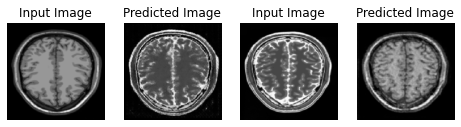

Saving checkpoint for epoch 45 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-45


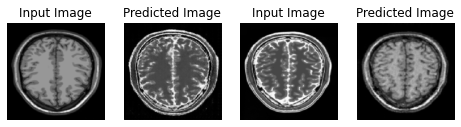

Saving checkpoint for epoch 46 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-46


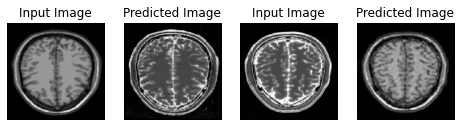

Saving checkpoint for epoch 47 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-47


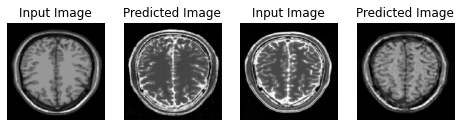

Saving checkpoint for epoch 48 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-48


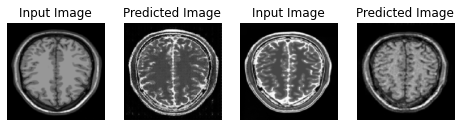

Saving checkpoint for epoch 49 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-49


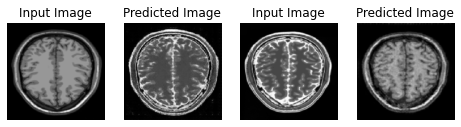

Saving checkpoint for epoch 50 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-50


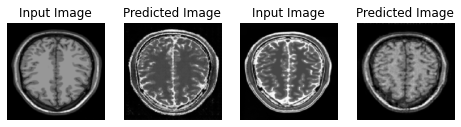

Saving checkpoint for epoch 51 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-51


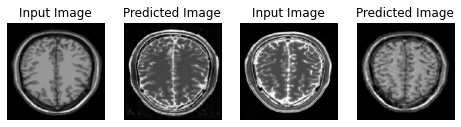

Saving checkpoint for epoch 52 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-52


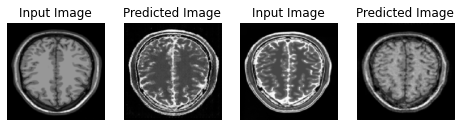

Saving checkpoint for epoch 53 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-53


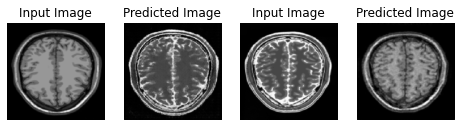

Saving checkpoint for epoch 54 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-54


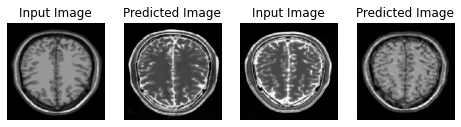

Saving checkpoint for epoch 55 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-55


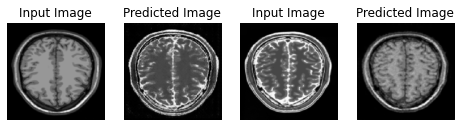

Saving checkpoint for epoch 56 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-56


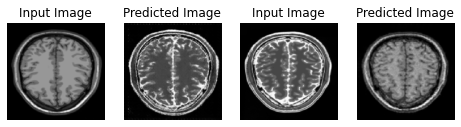

Saving checkpoint for epoch 57 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-57


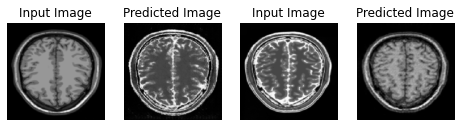

Saving checkpoint for epoch 58 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-58


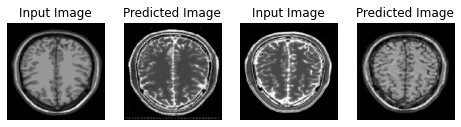

Saving checkpoint for epoch 59 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-59


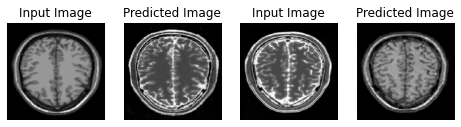

Saving checkpoint for epoch 60 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-60


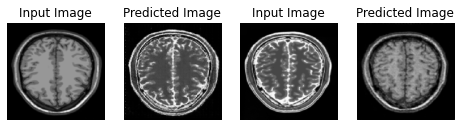

Saving checkpoint for epoch 61 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-61


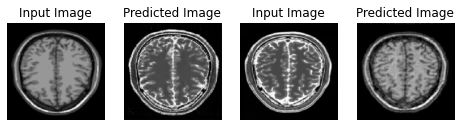

Saving checkpoint for epoch 62 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-62


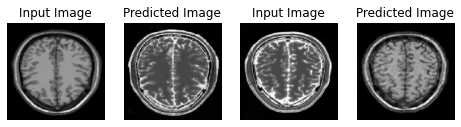

Saving checkpoint for epoch 63 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-63


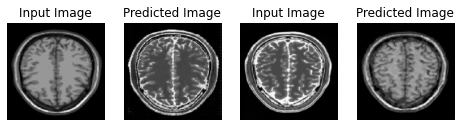

Saving checkpoint for epoch 64 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-64


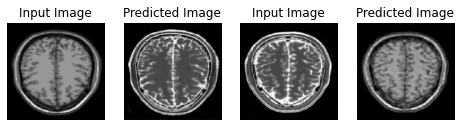

Saving checkpoint for epoch 65 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-65


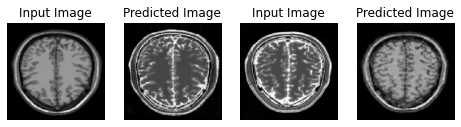

Saving checkpoint for epoch 66 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-66


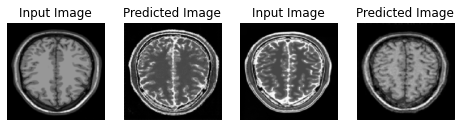

Saving checkpoint for epoch 67 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-67


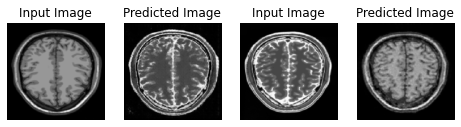

Saving checkpoint for epoch 68 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-68


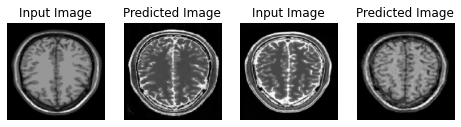

Saving checkpoint for epoch 69 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-69


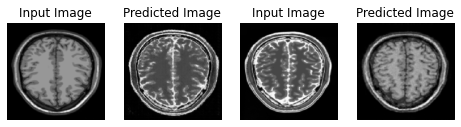

Saving checkpoint for epoch 70 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-70


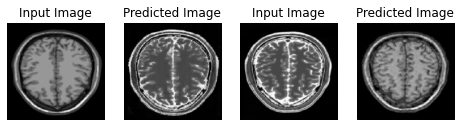

Saving checkpoint for epoch 71 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-71


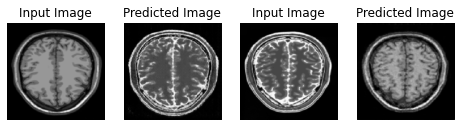

Saving checkpoint for epoch 72 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-72


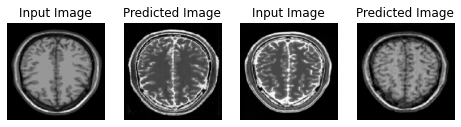

Saving checkpoint for epoch 73 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-73


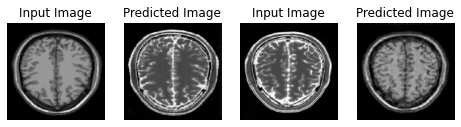

Saving checkpoint for epoch 74 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-74


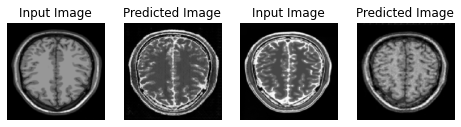

Saving checkpoint for epoch 75 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-75


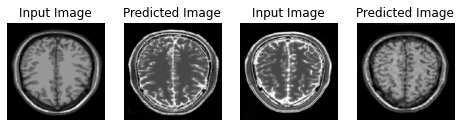

Saving checkpoint for epoch 76 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-76


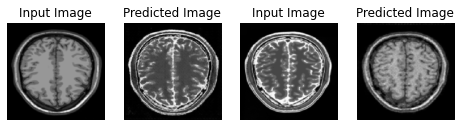

Saving checkpoint for epoch 77 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-77


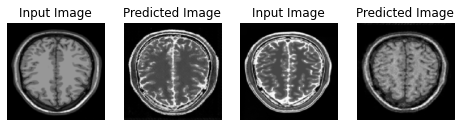

Saving checkpoint for epoch 78 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-78


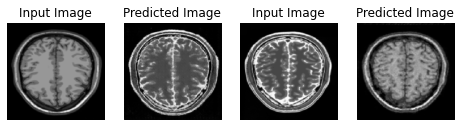

Saving checkpoint for epoch 79 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-79


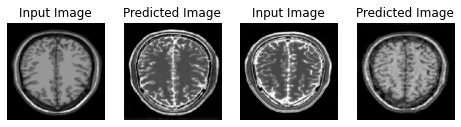

Saving checkpoint for epoch 80 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-80


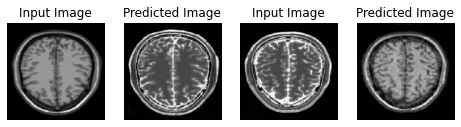

Saving checkpoint for epoch 81 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-81


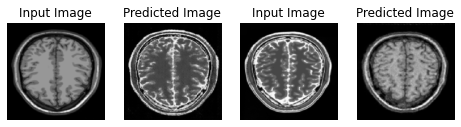

Saving checkpoint for epoch 82 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-82


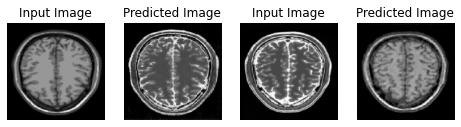

Saving checkpoint for epoch 83 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-83


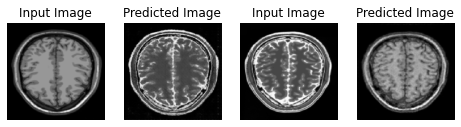

Saving checkpoint for epoch 84 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-84


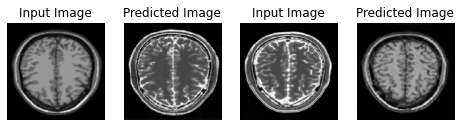

Saving checkpoint for epoch 85 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-85


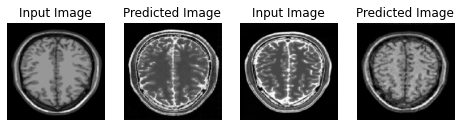

Saving checkpoint for epoch 86 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-86


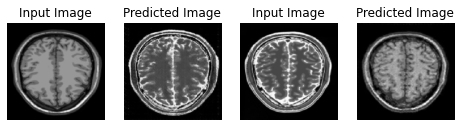

Saving checkpoint for epoch 87 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-87


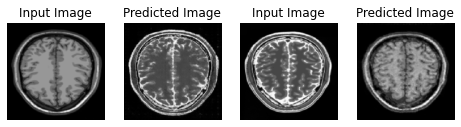

Saving checkpoint for epoch 88 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-88


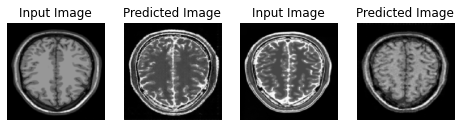

Saving checkpoint for epoch 89 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-89


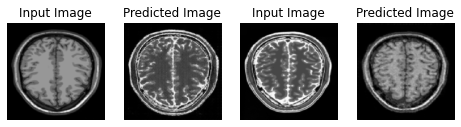

Saving checkpoint for epoch 90 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-90


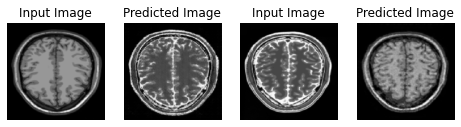

Saving checkpoint for epoch 91 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-91


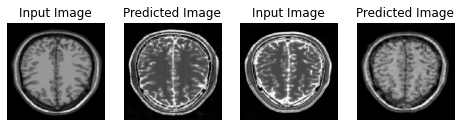

Saving checkpoint for epoch 92 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-92


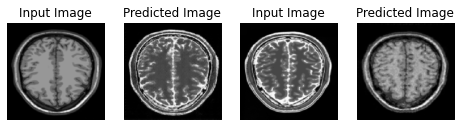

Saving checkpoint for epoch 93 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-93


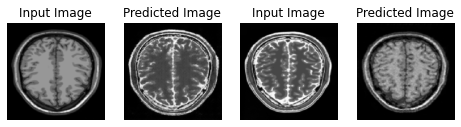

Saving checkpoint for epoch 94 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-94


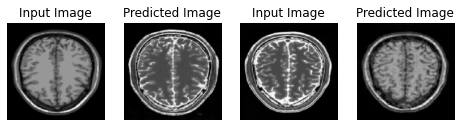

Saving checkpoint for epoch 95 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-95


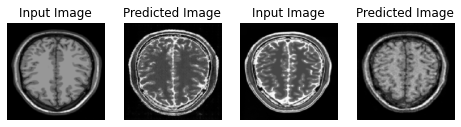

Saving checkpoint for epoch 96 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-96


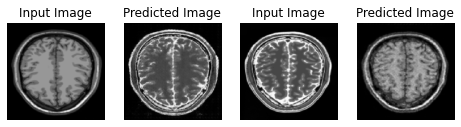

Saving checkpoint for epoch 97 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-97


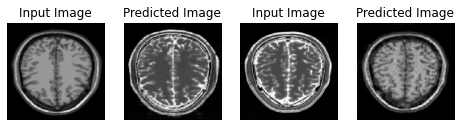

Saving checkpoint for epoch 98 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-98


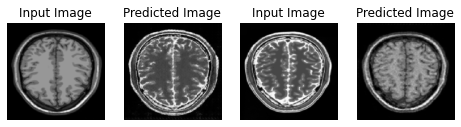

Saving checkpoint for epoch 99 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-99


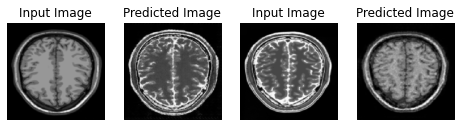

Saving checkpoint for epoch 100 at /content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/Trained_Model/ckpt-100


In [43]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((data_t1, data_t2)):
        train_step(image_x, image_y)
    generate_images(generator_g, ex_t1, generator_f, ex_t2)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Creating GIF

In [50]:
from skimage import img_as_ubyte

In [56]:
anim_file = 'cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    image = img_as_ubyte(image)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [45]:
!pip install git+https://github.com/tensorflow/docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-g46s3w09
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-g46s3w09
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=180247 sha256=2a0f9f26a99ee21d00ed7ce3b99343dbac662391e068f78c5a5e309e55d727eb
  Stored in directory: /tmp/pip-ephem-wheel-cache-xwtku6bq/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs



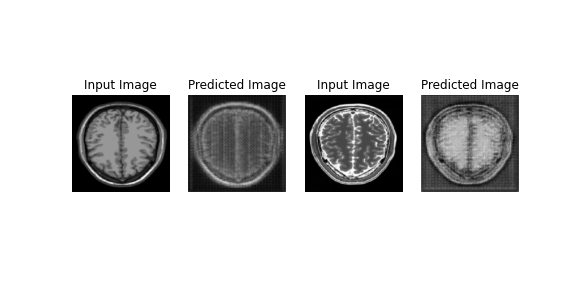

In [57]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

Downloading all images at each epoch

In [58]:
from google.colab import files


In [76]:
num_list = [str(i).zfill(4) for i in range(98,101)]

In [77]:
for num in num_list:
  files.download("/content/drive/MyDrive/Capstone Project/MRI T1 <-> T2/image_at_epoch_"+num+".png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>